In [1]:
using DifferentialEquations, Plots, Sundials

┌ Info: Precompiling DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1260
┌ Warning: No need to use this function anymore since MLStyle v0.4 at /home/nadanai/.julia/packages/JuliaVariables/7foOT/src/JuliaVariables.jl:9
└ @ MLStyle.Extension ~/.julia/packages/MLStyle/u6CDq/src/Extension.Deprecated.jl:22
┌ Warning: No need to use this function anymore since MLStyle v0.4
│   caller = @use(::LineNumberNode, ::Module, ::Vararg{Any,N} where N) at Extension.Deprecated.jl:23
└ @ MLStyle.Extension ~/.julia/packages/MLStyle/u6CDq/src/Extension.Deprecated.jl:23
┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1260


## Using DifferentialEquations.jl

### Ordinary differential equations

<div class="alert alert-block alert-info">
<b>ODEs</b>
\begin{equation}u' = f(u,p,t)\end{equation}
</div>

We will solve the Lotka-Volterra equations for a population of rabbits $R$ and wolves $W$:
\begin{align}
\frac{dR}{dt} &= \alpha R - \beta R W \\
\frac{dW}{dt} &= \gamma R W - \delta W 
\end{align}


In [2]:
# Solve the LV equations
# Define gradients
function lotka_volterra!(du,u,p,t) # ! means function modifies inputs in-place for efficiency
    R,W = u 
    α,β,γ,δ = p
    du[1] = dR = α*R - β*R*W
    du[2] = dW = γ*R*W - δ*W
end

# Set initial conditions, params, time span, and solve
u0 = [1.0,1.0]
tspan = (0.0,10.0)
p = [1.5,1.0,3.0,1.0]
prob = ODEProblem(lotka_volterra!,u0,tspan,p)
sol = solve(prob); # Semicolon suppresses output in jupyter notebook. Not necessary in scripts.

### Handling the output

In [3]:
# The solver returns a sol object which can be accessed in the following way

t = sol.t # Timepoints
u = sol.u # Trajectories, with time increments in columns (rather than rows as in Python)
sol[1] # gives the concentrations at a specific timestep
sol(0.75456) # gives the interpolated concentrations at an arbitrary time value

# To get individual trajectories:
R = Array(sol)[1,:]
W = Array(sol)[2,:];

# Julia arrays are 1-indexed

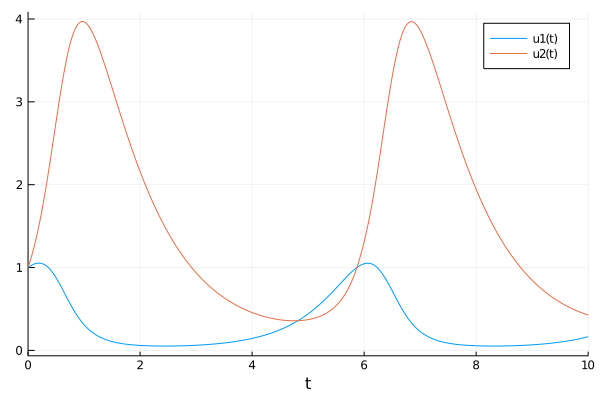

In [4]:
# Plots.jl automatically recognises the sol object 
# and its smooth interpolation
plot(sol)

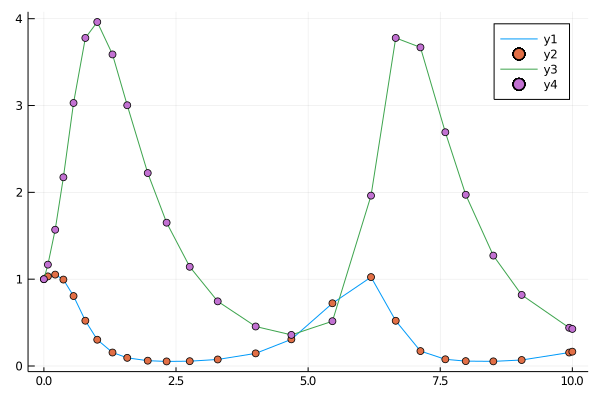

In [5]:
# But you can of course plot manually
plot(t,R); scatter!(t,R)
plot!(t,W); scatter!(t,W) # ! updates the existing plot

# Please see another notebook for more about plotting

### Common solver options
https://diffeq.sciml.ai/stable/basics/common_solver_opts/

In [6]:
### Common solver options demonstrated

# Set initial conditions, params, time span, and solve
u0 = [1.0,1.0]
tspan = (0.0,10.0)
p = [1.5,1.0,3.0,1.0]
prob = ODEProblem(lotka_volterra!,u0,tspan,p)

ODEProblem with uType Array{Float64,1} and tType Float64. In-place: true
timespan: (0.0, 10.0)
u0: [1.0, 1.0]

In [7]:
# We can call different solvers 
sol = solve(prob, Tsit5()); 

# Discussed in great length in documentation:
# https://diffeq.sciml.ai/stable/solvers/ode_solve/

# Summary:
# For non-stiff problems, use Tsit5()
# For stiff problems, use Rosenbrock23()

# Normally values are saved at the adaptive timesteps
# returned by the solver. We can also instead save at
# specific intervals, with linear interpolations between
# them if you call sol as a function. 
sol = solve(prob, saveat=0.1);

# We can turn off polynomial interpolation by setting
sol = solve(prob, dense=false);
# This again returns sol with linear interpolation. If
# you don't need interpolation this saves a lot of memory.

### Stochastic differential equations and ensembles of solutions
https://diffeq.sciml.ai/stable/tutorials/sde_example/

<div class="alert alert-block alert-info">
<b>SDEs</b>
\begin{equation}du = f(u,p,t)dt + g(u,p,t)dW\end{equation}
</div>

Let's add some multiplicative noise to our equations:
\begin{align}
\frac{dR}{dt} &= \alpha R - \beta R W + 0.3Rξ(t)\\
\frac{dW}{dt} &= \gamma R W - \delta W + 0.3Wξ(t)
\end{align}
where ξ(t) is Gaussian white noise. 

In [8]:
# To do this we define a noise function and call SDEProblem

function multiplicative_noise!(du,u,p,t)
    R,W = u
    du[1] = 0.3*R # additive noise term
    du[2] = 0.3*W
end

# We can solve one instance of the trajectory
prob = SDEProblem(lotka_volterra!,multiplicative_noise!,u0,tspan,p)
sol = solve(prob)

# Or an ensemble
ensembleprob = EnsembleProblem(prob)
ensembleSol = solve(ensembleprob, SOSRI(), EnsembleThreads(),trajectories=100);

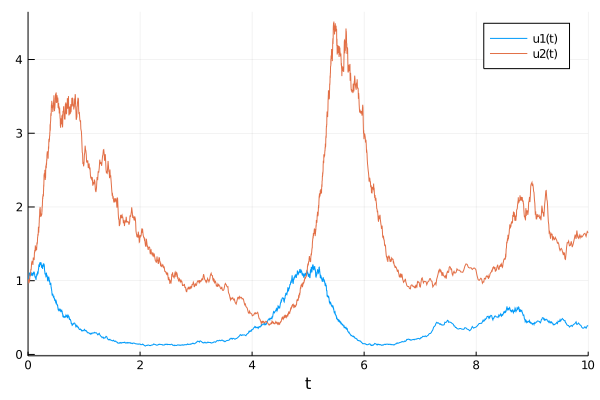

In [9]:
# A single trajectory
plot(sol)

In [10]:
# We can plot all ensemble trajectories
plot(ensembleSol)

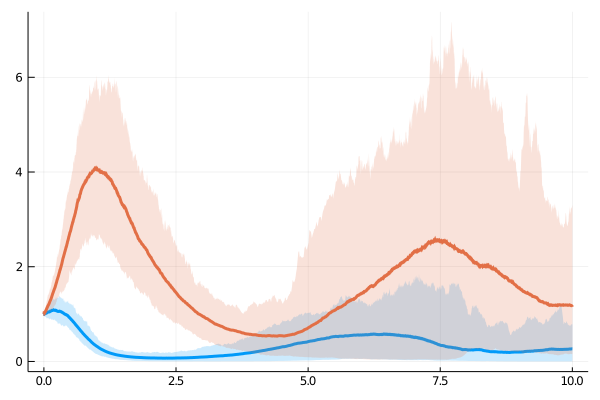

In [11]:
# Or a summary
summary = EnsembleSummary(ensembleSol)
plot(summary)

### Delay differential equations
https://diffeq.sciml.ai/stable/tutorials/dde_example/

<div class="alert alert-block alert-info">
<b>DDEs</b>
\begin{equation}u' = f(u(t),u(t-\tau),p,t)\end{equation}
</div>

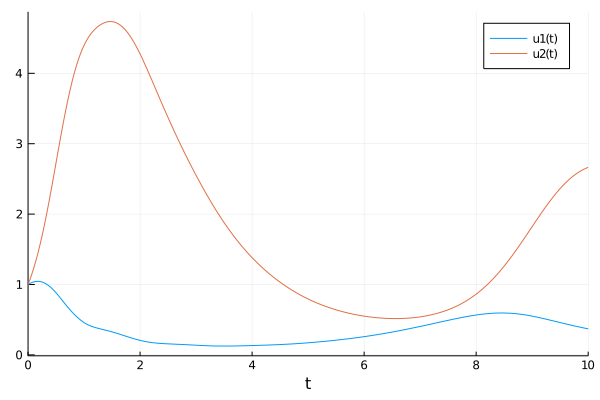

In [12]:
# Here we need to define a delay function, then call DDEProblem

τ = 1.0 # constant lag
function lotka_volterra_delay!(du,u,h,p,t) 
    R,W = u
    delayR = h(p,t-τ;idxs=1)
    α,β,γ,δ = p
    du[1] = dR = α*delayR - β*R*W # delayed rabbit birth rates
    du[2] = dW = γ*R*W - δ*W
end

u0 = [1.0,1.0]
tspan = (0.0,10.0)
h(p,t) = [1.0,1.0]
h(p,t;idxs=1) = 1.0
p = [1.5,1.0,3.0,1.0]
prob = DDEProblem(lotka_volterra_delay!,u0,h,tspan,p,constant_lag=[τ])
sol = solve(prob);
plot(sol)

### Events
https://diffeq.sciml.ai/stable/features/callback_functions/

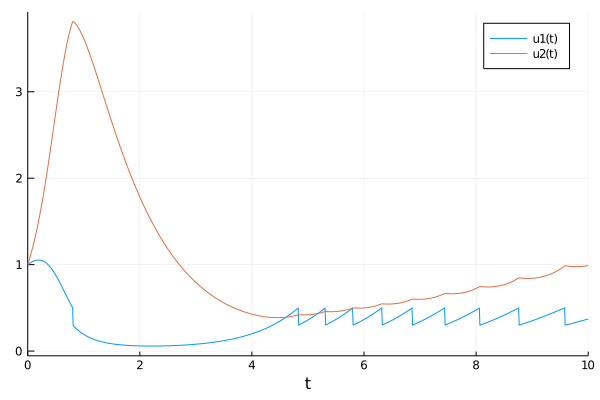

In [13]:
# We can perturb the trajectories using event callbacks. 
# Callbacks have two parts: a condition, and an effect.

# 1. The condition is a function which triggers the event 
# when it is equal to 0. For example, we want rabbits to be
# killed when their population reaches 0.5:

condition_killrabbits(u,t,integrator) = u[1] - 0.5 # triggers when u[1]=0.5

# 2. The effect is the result of the event trigger

effect_killrabbits!(integrator) = integrator.u[1] -= 0.2 # reduce rabbit population by 0.2

# Finally define the callback and solve
cb = ContinuousCallback(condition_killrabbits,effect_killrabbits!)

# Set initial conditions, params, time span, and solve
u0 = [1.0,1.0]
tspan = (0.0,10.0)
p = [1.5,1.0,3.0,1.0]
prob = ODEProblem(lotka_volterra!,u0,tspan,p)
sol = solve(prob, callback=cb); 
plot(sol)

# Other possibilities are to have perturbations periodically,
# or at preset times, or completely custom-defined events.

### Differential algebraic equations
https://diffeq.sciml.ai/stable/tutorials/dae_example/

<div class="alert alert-block alert-info">
<b>DAEs</b>
\begin{align}u' &= f(u,p,t) \\ 0&=g(u,p,t)\end{align}
</div>

Finally we look at how to solve DAEs such as the Robertson equations

\begin{align}
\frac{y_1}{dt} &= -k_1 y_1 + k_3 y_2 y_3 \\
\frac{y_2}{dt} &= k_1 y_1 - k_3 y_2 y_3 - k_2 y_2^2 \\
    1 &= y_1 + y_2 + y_3
\end{align}

\begin{align}
k_1 &= 0.04 \\
k_2 &= 3e7 \\
k_3 &= 1e4 
\end{align}

These is a classic stiff system with an algebraic constraint.

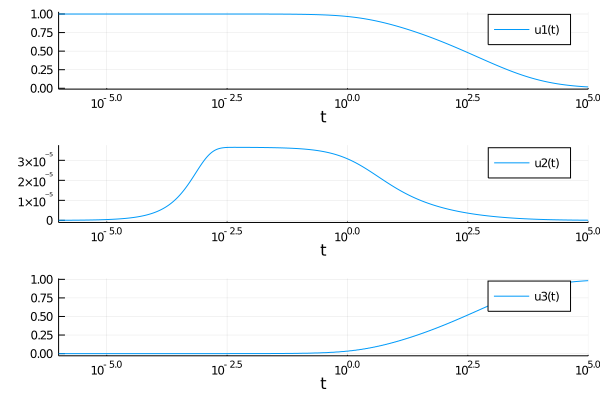

In [14]:
# There are two ways of doing this: 
# First is to use ODEProblem and a mass matrix, which
# determines which rows of your gradient function 
# correspond to differential variables

function rober!(du,u,p,t)
    y₁,y₂,y₃ = u
    k₁,k₂,k₃ = p
    du[1] = - k₁*y₁ + k₃*y₂*y₃
    du[2] = k₁*y₁ - k₃*y₂*y₃ - k₂*y₂^2
    du[3] = y₁ + y₂ + y₃ - 1 # our conservation law
end

M = [1. 0  0 
     0  1. 0
     0  0  0] # The matrix by which our function is multiplied to obtain differentiable terms

f = ODEFunction(rober!,mass_matrix=M)
u₀ = [1.0,0.0,0.0]
tspan = (0.0,1e5)
p = (0.04,3e7,1e4)
prob = ODEProblem(f,u₀,tspan,p)
sol = solve(prob,Rodas5(),reltol=1e-8,abstol=1e-8);
plot(sol,xscale=:log10, tspan=(1e-6,1e5), layout=(3,1))

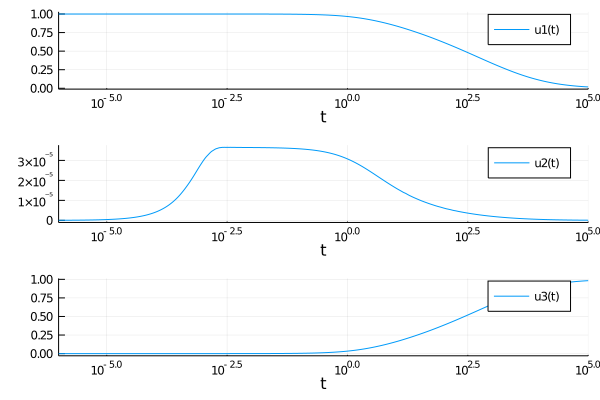

In [15]:
# An alternative way is to use the DAEProblem function
# Here we need initial conditions for our derivatives 
# and the IDA solver from Sundials

# The gradient is defined slightly differently:
function roberDAE!(out,du,u,p,t)
    y₁,y₂,y₃ = u
    k₁,k₂,k₃ = p
    out[1] = - k₁*y₁ + k₃*y₂*y₃ - du[1]
    out[2] = k₁*y₁ - k₃*y₂*y₃ - k₂*y₂^2 - du[2]
    out[3] = y₁ + y₂ + y₃ - 1
end
u₀ = [1.0,0.0,0.0]
du₀ = [-0.04, 0.04, 0.0]
tspan = (0.0,1e5)
p = (0.04,3e7,1e4)
differential_vars = [true,true,false]
prob = DAEProblem(roberDAE!,du₀,u₀,tspan,p,differential_vars=differential_vars)
sol = solve(prob,IDA())
plot(sol,xscale=:log10, tspan=(1e-6,1e5), layout=(3,1))